> # ***Monte Carlo Simulation for Trading***

> ### Importing Necessary Libraries and Packages
> In this cell, we import all the necessary libraries and packages required for our analysis. This includes:
- `numpy` for numerical computations,
- `pandas` for data manipulation and analysis,
- `matplotlib.pyplot` for data visualization,
- `yfinance` for downloading historical market data from Yahoo Finance, and
- `scipy.stats.norm` for statistical functions.
Note: The commented-out `pip install` command suggests that these libraries should be installed prior to running the notebook if not already present in the environment.


In [1]:
# pip install yfinance numpy matplotlib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf
from scipy.stats import norm

> ### Data Acquisition
> - We use the `yfinance` library to download historical stock data for Tesla (TSLA) and NVIDIA (NVDA). The data is fetched from Yahoo Finance and stored in pandas DataFrames `df_tsla` for Tesla and `df_nvda` for NVIDIA, respectively. This step is crucial for performing further analysis on these stocks.
> ### Data Inspection
> - Preliminary inspection of the data, such as recent stock performance, is conducted to ensure accuracy and relevance for analysis.

In [2]:
# Downloading Stock Data from yfinance (Yahoo! Finance) for TESLA and NVIDIA shares.
df_tsla = yf.download('TSLA')
df_nvda = yf.download('NVDA')

c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\yfinance\utils.py:775: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
[*********************100%%**********************]  1 of 1 completed
c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\yfinance\utils.py:775: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')
[*********************100%%**********************]  1 of 1 completed


> ### Exploratory Data Analysis (EDA)
> - The EDA phase includes visualizations of stock price trends, calculations of statistical summaries, and identification of patterns in the stock market data.

In [3]:
df_tsla.tail()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2024-02-15,189.160004,200.880005,188.860001,200.449997,200.449997,120831800
2024-02-16,202.059998,203.169998,197.399994,199.949997,199.949997,111173600
2024-02-20,196.130005,198.600006,189.130005,193.759995,193.759995,104545800
2024-02-21,193.360001,199.440002,191.949997,194.770004,194.770004,103844000
2024-02-22,194.000000,198.320007,191.360001,197.410004,197.410004,92538200


In [4]:
df_nvda.tail()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2024-02-15,738.690002,739.750000,724.000000,726.580017,726.580017,42012200
2024-02-16,741.000000,744.020020,725.010010,726.130005,726.130005,49391800
2024-02-20,719.469971,719.559998,677.340027,694.520020,694.520020,70483300
2024-02-21,680.059998,688.880005,662.479980,674.719971,674.719971,69029800
2024-02-22,750.250000,785.750000,742.200012,785.380005,785.380005,85648100


> #### Calculating daily returns of `TESLA` and `NVIDIA` using pandas *`.pct_change()`* for calculating the percentage change between current and prior element.

In [5]:
df_tsla['Returns'] = df_tsla['Close'].pct_change()

df_nvda['Returns'] = df_nvda['Close'].pct_change()

In [6]:
# Set the number of simulations and the time horizon (in this case, 66 trading days 3 months)
num_simulations = 30000
num_days = 66

In [7]:
# Extract the last closing price for TESLA and NVIDIA
last_price_tsla = df_tsla['Close'].iloc[-1]

last_price_nvda = df_nvda['Close'].iloc[-1]

In [8]:
# Prepare an array to store the simulations
simulation_df_tsla = np.zeros((num_days, num_simulations))

simulation_df_nvda = np.zeros((num_days, num_simulations))

> #### Parameters for *`GBM model`* (Geometric Brownian Motion Model)

In [12]:
mu_tsla = df_tsla['Returns'].mean() # Mean of daily returns for TSLA
sigma_tsla = df_tsla['Returns'].std() # Standard deviation of daily returns TSLA

mu_nvda = df_nvda['Returns'].mean() # Mean of daily returns for NVDA
sigma_nvda = df_nvda['Returns'].std() # Standard deviation of daily returns NVDA

> #### Simulating future shares price path with *GBM model*

In [15]:
# Simulating the price paths for TESLA
for simulation in range(num_simulations):
    # List to store each simulation
    price_list_tsla = [last_price_tsla]

    for day in range(num_days):
        # Generate a random price based on GBM formula
        price_tsla = price_list_tsla[-1] * (1 + np.random.normal(mu_tsla, sigma_tsla))
        price_list_tsla.append(price_tsla) 

    simulation_df_tsla[:, simulation] = price_list_tsla[1:]

In [20]:
# Simulating the price paths for NVIDIA
for simulation in range(num_simulations):
    # List to store each simulation
    price_list_nvda = [last_price_nvda]

    for day in range(num_days):
        # Generate a random price based on GBM formula
        price_nvda = price_list_nvda[-1] * (1 + np.random.normal(mu_nvda, sigma_nvda))
        price_list_nvda.append(price_nvda)

    simulation_df_nvda[:, simulation] = price_list_nvda[1:]

> #### Visualizing the simulation results

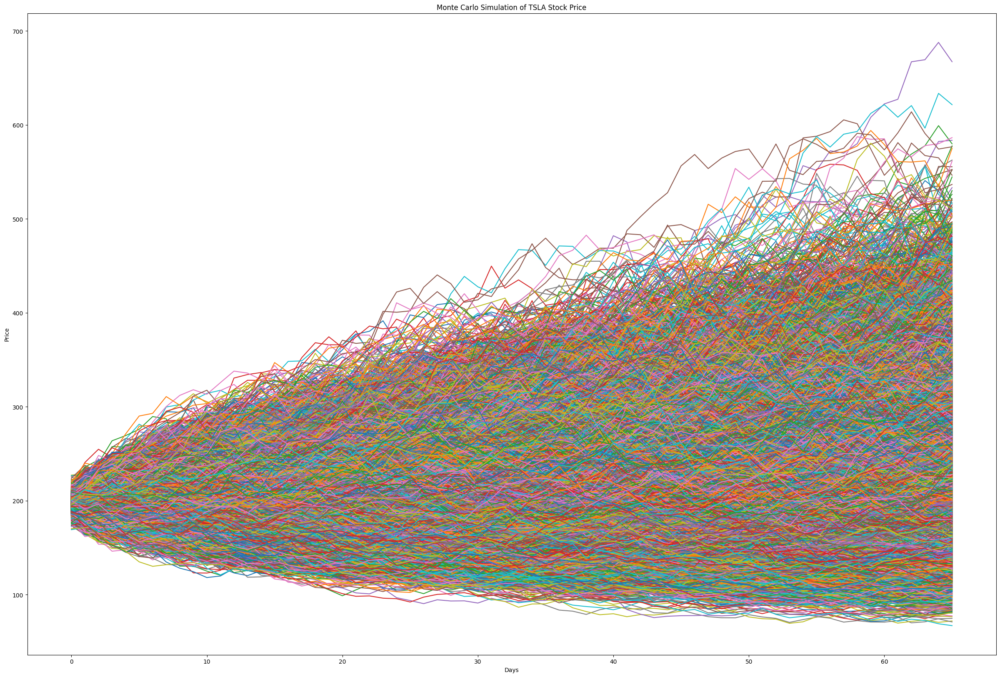

In [19]:
# Plotting TSLA simulation results
plt.figure(figsize=(30,20))
plt.plot(simulation_df_tsla)
plt.title('Monte Carlo Simulation of TSLA Stock Price')
plt.xlabel('Days')
plt.ylabel('Price')
plt.show()

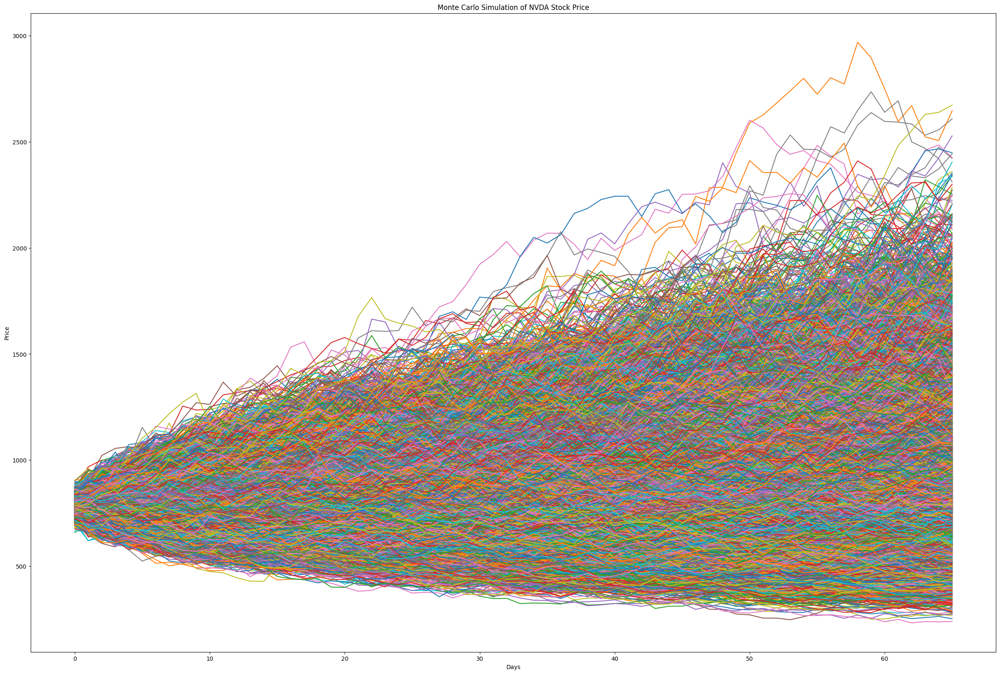

In [21]:
# Plotting NVIDIA's simulation results
plt.figure(figsize=(30,20))
plt.plot(simulation_df_nvda)
plt.title('Monte Carlo Simulation of NVDA Stock Price')
plt.xlabel('Days')
plt.ylabel('Price')
plt.show()

> ## Findings from Stock Price Simulations
> ### Tesla (TSLA)
> - Volatility and Growth: The simulation indicates a high degree of volatility in Tesla's stock price, with potential for significant growth. Forecasted paths show upward trends, suggesting optimism in Tesla's market performance, albeit with notable fluctuations.
> - Risk Assessment: Given the wide range of simulated outcomes, Tesla's stock appears to carry a higher risk, which could translate to higher potential rewards for investors willing to tolerate volatility.
> ### NVIDIA (NVDA)
> - Steady Growth: NVIDIA's simulation results depict a more steady growth trajectory compared to Tesla. The lesser volatility suggests a more predictable performance, potentially making it a safer investment for risk-averse individuals.
> - Market Stability: The narrow spread of NVIDIA's forecasted stock price paths indicates confidence in the company's stable market position and consistent growth prospects.

> ## Comparative Analysis
> - Performance Contrast: When comparing the simulated outcomes of TSLA and NVDA, it's evident that TSLA offers a high-risk, high-reward investment opportunity, while NVDA presents a more stable growth path.
> - Investment Strategy Implications: Investors' choice between TSLA and NVDA might depend on their risk tolerance, investment horizon, and confidence in each company's strategic direction.

> ## Conclusions
> The simulation exercise provides valuable insights into the potential future performance of Tesla and NVIDIA stocks. While both companies exhibit growth potential, their risk profiles and volatility levels differ markedly, reflecting their respective market positions and business strategies.
> - For Risk-Tolerant Investors: Tesla represents an attractive option for those seeking aggressive growth and willing to accept the associated risks of volatility.
> - For Risk-Averse Investors: NVIDIA emerges as a compelling choice, offering steady growth with lower volatility, suitable for a conservative investment approach.

> ## Strategic Recommendations
> - Diversified Portfolio: Investors might consider a diversified approach, allocating portions of their portfolio to both stocks to balance risk and reward.
> - Continuous Monitoring: Given the inherent uncertainties in stock market investments, continuous monitoring of market trends, company performance, and economic indicators is advisable to adjust investment strategies as needed.

> ### <span style="color:red">**Disclaimer**: *Monte Carlo Simulation is based on historic events and randomness. Hence, can not predict the future with ceratinty.*</span>